### Introduction

- This analysis is based on the [COVID-19 Community Mobility Reports](https://www.google.com/covid19/mobility/index.html?hl=en) created by Google. The reports aim to provide insights into what has changed in response to policies aimed at combating COVID-19. The reports chart movement trends over time by geography, across different categories of places such as retail and recreation, groceries and pharmacies, parks, transit stations, workplaces, and residential.
- In order to run the analysis, make sure you download the [original dataset](https://www.google.com/covid19/mobility/index.html?hl=en) from Google and run all the code chunks in the `data_cleaning.ipynb` to create the cleaned dataframe that only focuses on the trend in the U.S
- In order to find the correlation between COVID cases and the mobility trend, I also combined it with the [COVID-19 dataset](https://github.com/nytimes/covid-19-data) from New York Times. There is also an interesting pattern of how people from different states are responding to the number of confirmed cases and deaths.
- The analysis can be found in the `data_analysis.ipynb` notebook. There is also a [Plotly Dash](https://plot.ly/dash) app built on top that. You can find how to run the app in the README file.

### Loading data

In [35]:
import pandas as pd
df = pd.read_csv('https://graderdata.s3.amazonaws.com/US_Mobility_Report.csv')

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1674338 entries, 0 to 1674337
Data columns (total 9 columns):
 #   Column       Non-Null Count    Dtype  
---  ------       --------------    -----  
 0   state        1674338 non-null  object 
 1   county       1674338 non-null  object 
 2   date         1674338 non-null  object 
 3   retail       1079063 non-null  float64
 4   grocery      966312 non-null   float64
 5   parks        386361 non-null   float64
 6   transit      618807 non-null   float64
 7   workplaces   1640033 non-null  float64
 8   residential  955607 non-null   float64
dtypes: float64(6), object(3)
memory usage: 115.0+ MB


In [37]:
desired_county = 'Autauga County'
filtered_df = df[df['county'] == desired_county]
filtered_df

,state,county,date,retail,grocery,parks,transit,workplaces,residential
0,AL,Autauga County,2020-02-15,5.0,7.0,NaN,NaN,-4.0,NaN
1,AL,Autauga County,2020-02-16,0.0,1.0,-23.0,NaN,-4.0,NaN
2,AL,Autauga County,2020-02-17,8.0,0.0,NaN,NaN,-27.0,5.0
3,AL,Autauga County,2020-02-18,-2.0,0.0,NaN,NaN,2.0,0.0
4,AL,Autauga County,2020-02-19,-2.0,0.0,NaN,NaN,2.0,0.0
...,...,...,...,...,...,...,...,...,...
654,AL,Autauga County,2021-12-06,-8.0,8.0,NaN,NaN,-10.0,5.0
655,AL,Autauga County,2021-12-07,6.0,12.0,NaN,NaN,-10.0,4.0
656,AL,Autauga County,2021-12-08,10.0,14.0,NaN,NaN,-9.0,4.0
657,AL,Autauga County,2021-12-09,7.0,21.0,NaN,NaN,-8.0,4.0


In [38]:
# Convert the date column to datetime type
df.date = pd.to_datetime(df.date, format='%Y-%m-%d')

In [39]:
df.head(10)

,state,county,date,retail,grocery,parks,transit,workplaces,residential
0,AL,Autauga County,2020-02-15,5.0,7.0,NaN,NaN,-4.0,NaN
1,AL,Autauga County,2020-02-16,0.0,1.0,-23.0,NaN,-4.0,NaN
2,AL,Autauga County,2020-02-17,8.0,0.0,NaN,NaN,-27.0,5.0
3,AL,Autauga County,2020-02-18,-2.0,0.0,NaN,NaN,2.0,0.0
4,AL,Autauga County,2020-02-19,-2.0,0.0,NaN,NaN,2.0,0.0
5,AL,Autauga County,2020-02-20,-8.0,-3.0,NaN,NaN,1.0,2.0
6,AL,Autauga County,2020-02-21,-3.0,-2.0,NaN,NaN,3.0,0.0
7,AL,Autauga County,2020-02-22,1.0,1.0,NaN,NaN,8.0,NaN
8,AL,Autauga County,2020-02-23,0.0,3.0,NaN,NaN,5.0,NaN
9,AL,Autauga County,2020-02-24,-2.0,-5.0,NaN,NaN,2.0,1.0


### What does the number stand for

- Changes for each day are compared to a baseline value for that day of the week:
 - The baseline is the median value, for the corresponding day of the week, during the 5-week period **Jan 3–Feb 6, 2020.**
 - The datasets show trends over several months with the most recent data representing approximately **2-3** days ago—this is how long it takes to produce the datasets.

### Place categories
- **Grocery & pharmacy**: Mobility trends for places like grocery markets, food warehouses, farmers markets, specialty food shops, drug stores, and pharmacies.
- **Parks**: Mobility trends for places like local parks, national parks, public beaches, marinas, dog parks, plazas, and public gardens.
- **Transit stations**: Mobility trends for places like public transport hubs such as subway, bus, and train stations.
- **Retail & recreation**: Mobility trends for places like restaurants, cafes, shopping centers, theme parks, museums, libraries, and movie theaters.
- **Residential**: Mobility trends for places of residence.
- **Workplaces**: Mobility trends for places of work.

### Now let's move on to the COVID data

In [40]:
covid_df = pd.read_csv('https://graderdata.s3.amazonaws.com/covid_cases.csv')
covid_df.head(10)

,date,state,cases,deaths
0,2020-01-21,WA,1,0
1,2020-01-22,WA,1,0
2,2020-01-23,WA,1,0
3,2020-01-24,IL,1,0
4,2020-01-24,WA,1,0
5,2020-01-25,CA,1,0
6,2020-01-25,IL,1,0
7,2020-01-25,WA,1,0
8,2020-01-26,AZ,1,0
9,2020-01-26,CA,2,0


In [41]:
covid_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35846 entries, 0 to 35845
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   date    35846 non-null  object
 1   state   33222 non-null  object
 2   cases   35846 non-null  int64 
 3   deaths  35846 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 1.1+ MB


In [42]:
max_deaths_by_state = covid_df.groupby('state')['deaths'].max().reset_index()

# Sort DataFrame by maximum deaths (descending order)
sorted_by_max_deaths = max_deaths_by_state.sort_values(by='deaths', ascending=False)

print(sorted_by_max_deaths)

print(max_deaths_by_state)

   state  deaths
4     CA   75477
42    TX   74923
8     FL   62026
33    NY   57671
37    PA   34616
13    IL   29842
9     GA   29700
30    NJ   28576
34    OH   27371
21    MI   26880
3     AZ   23040
18    MA   19634
26    NC   18986
14    IN   18014
41    TN   17574
1     AL   16265
23    MO   15716
44    VA   14895
17    LA   14877
39    SC   14375
16    KY   11606
35    OK   11384
19    MD   11255
47    WI   10386
24    MS   10326
22    MN    9996
5     CO    9830
46    WA    9602
6     CT    8972
2     AR    8848
32    NV    8189
11    IA    7550
15    KS    6858
31    NM    5474
36    OR    5381
48    WV    5085
12    ID    4030
43    UT    3640
38    RI    2957
28    NE    2863
25    MT    2822
40    SD    2398
7     DE    2218
27    ND    1989
29    NH    1781
49    WY    1472
20    ME    1367
50    dc    1199
10    HI    1055
0     AK     862
45    VT     432
   state  deaths
0     AK     862
1     AL   16265
2     AR    8848
3     AZ   23040
4     CA   75477
5     CO    98

In [43]:
# Convert the date column to datetime type
covid_df.date = pd.to_datetime(covid_df.date, format='%Y-%m-%d')

### As a starter, let's only focus on the state level data

In [44]:
final_df = df.merge(covid_df, how="inner", on=['state', 'date'])

In [45]:
final_df.head(10)

,state,county,date,retail,grocery,parks,transit,workplaces,residential,cases,deaths
0,AL,Autauga County,2020-03-13,8.0,51.0,NaN,NaN,3.0,-2.0,6,0
1,AL,Baldwin County,2020-03-13,15.0,38.0,105.0,19.0,-3.0,0.0,6,0
2,AL,Barbour County,2020-03-13,24.0,5.0,NaN,NaN,4.0,NaN,6,0
3,AL,Bibb County,2020-03-13,13.0,26.0,NaN,NaN,11.0,NaN,6,0
4,AL,Blount County,2020-03-13,6.0,28.0,NaN,NaN,1.0,1.0,6,0
5,AL,Bullock County,2020-03-13,3.0,25.0,NaN,NaN,-3.0,NaN,6,0
6,AL,Butler County,2020-03-13,12.0,22.0,NaN,NaN,0.0,NaN,6,0
7,AL,Calhoun County,2020-03-13,6.0,29.0,NaN,NaN,-3.0,1.0,6,0
8,AL,Chambers County,2020-03-13,14.0,28.0,NaN,NaN,1.0,-2.0,6,0
9,AL,Cherokee County,2020-03-13,10.0,20.0,NaN,NaN,-1.0,NaN,6,0


### dump the data for faster access from the app

In [46]:
final_df.to_pickle('app.data')

### Let's quickly "confirm" the COVID cases trend in each state

In [50]:
import plotly.express as px
FL_df = final_df.loc[final_df.state=="FL"].copy()
CA_df = final_df.loc[final_df.state=="CA"].copy()
# Plotting FL_df
# Concatenate FL_df and CA_df into one DataFrame
combined_df = pd.concat([FL_df, CA_df])

# Plotting combined DataFrame
fig = px.line(combined_df, x='date', y='cases', color='state',
              title='COVID-19 Cases Over Time in FL and CA',
              labels={'date': 'Date', 'cases': 'Cases', 'state': 'State'})

# Show the plot
fig.show()

### Also "confirm" the mobility trend in each category

In [51]:
fig = px.line(CA_df, x='date', y='retail')
fig.show()

In [52]:
# Look at six different categories at the same time
fig = px.scatter(CA_df, x="date", y=["retail", "grocery", "parks", "transit", "workplaces", "residential"])
fig.show()

In [55]:
pip install fbprophet

  Using cached fbprophet-0.7.1.tar.gz (64 kB)
  Preparing metadata (setup.py) ... done
  Using cached cmdstanpy-0.9.5-py3-none-any.whl (37 kB)
  Using cached pystan-3.9.0-py3-none-any.whl (13 kB)
  Using cached LunarCalendar-0.0.9-py2.py3-none-any.whl (18 kB)
  Using cached convertdate-2.4.0-py3-none-any.whl (47 kB)
  Using cached setuptools_git-1.2-py2.py3-none-any.whl (10 kB)
  Using cached PyMeeus-0.5.12-py3-none-any.whl
  Using cached ephem-4.1.5-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (1.8 MB)
  Using cached clikit-0.6.2-py2.py3-none-any.whl (91 kB)
  Using cached httpstan-4.12.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (45.3 MB)
  Using cached pysimdjson-5.0.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (1.8 MB)
  Using cached crashtest-0.3.1-py3-none-any.whl (7.0 kB)
  Using cached pastel-0.2.1-py2.py3-none-any.whl (6.0 kB)
  Using cached pylev-1.4.0-py2.py3-none-any.whl (6.1 kB)
  Using cached marshmallow-3.21.1-py3-none-any.w

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
from fbprophet import Prophet


# Convert 'date' column to datetime format
CA_df['date'] = pd.to_datetime(CA_df['date'])

# Prepare data for Prophet: renaming columns to 'ds' and 'y'
data_prophet = CA_df[['date', 'cases']].rename(columns={'date': 'ds', 'cases': 'y'})

# Initialize Prophet model
model = Prophet()

# Fit the model
model.fit(data_prophet)

# Make future dataframe for next 3 months (90 days)
future = model.make_future_dataframe(periods=90)

# Predict cases for the future dates
forecast = model.predict(future)

# Plot forecast
fig = model.plot(forecast, xlabel='Date', ylabel='Cases', figsize=(10, 6))
plt.title('Forecast of COVID-19 Cases in California (Next 3 Months)')
plt.show()

# Show components of the forecast (trend, yearly, weekly)
fig_comp = model.plot_components(forecast, figsize=(10, 8))
plt.show()

# Display the forecasted values for the next 3 months
forecast_next_3_months = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(90)
print(forecast_next_3_months[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])


ModuleNotFoundError: No module named 'fbprophet'

In [59]:
CA_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 36490 entries, 94226 to 130715
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   state        36490 non-null  object        
 1   county       36490 non-null  object        
 2   date         36490 non-null  datetime64[ns]
 3   retail       34026 non-null  float64       
 4   grocery      32249 non-null  float64       
 5   parks        28015 non-null  float64       
 6   transit      27357 non-null  float64       
 7   workplaces   36366 non-null  float64       
 8   residential  30639 non-null  float64       
 9   cases        36490 non-null  int64         
 10  deaths       36490 non-null  int64         
dtypes: datetime64[ns](1), float64(6), int64(2), object(2)
memory usage: 3.3+ MB


In [60]:
CA_df1=CA_df.drop(['state', 'county'], axis=1)

### Let's take a look at what drives the number of COVID cases

In [61]:
CA_df1.corr()

,date,retail,grocery,parks,transit,workplaces,residential,cases,deaths
date,1.000000,0.379820,0.109441,0.054656,0.010067,0.102279,-0.322125,0.972115,0.971336
retail,0.379820,1.000000,0.754089,0.453760,0.587374,0.582095,-0.761539,0.380283,0.412809
grocery,0.109441,0.754089,1.000000,0.517431,0.610559,0.456447,-0.574535,0.096347,0.128048
parks,0.054656,0.453760,0.517431,1.000000,0.236327,0.212420,-0.344387,0.033207,0.077775
transit,0.010067,0.587374,0.610559,0.236327,1.000000,0.506123,-0.574709,0.009996,0.032206
workplaces,0.102279,0.582095,0.456447,0.212420,0.506123,1.000000,-0.869888,0.119343,0.128284
residential,-0.322125,-0.761539,-0.574535,-0.344387,-0.574709,-0.869888,1.000000,-0.316043,-0.345756
cases,0.972115,0.380283,0.096347,0.033207,0.009996,0.119343,-0.316043,1.000000,0.989430
deaths,0.971336,0.412809,0.128048,0.077775,0.032206,0.128284,-0.345756,0.989430,1.000000


<Axes: >

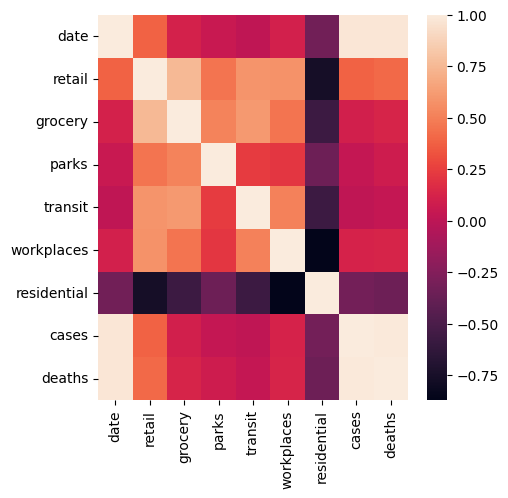

In [62]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

plt.figure(figsize= (5,5), dpi=100)
sns.heatmap(CA_df1.corr())

Epoch 1/10
993/993 - 5s - loss: 0.1410 - 5s/epoch - 5ms/step
Epoch 2/10
993/993 - 2s - loss: 0.1334 - 2s/epoch - 2ms/step
Epoch 3/10
993/993 - 2s - loss: 0.1344 - 2s/epoch - 2ms/step
Epoch 4/10
993/993 - 2s - loss: 0.1334 - 2s/epoch - 2ms/step
Epoch 5/10
993/993 - 3s - loss: 0.1324 - 3s/epoch - 3ms/step
Epoch 6/10
993/993 - 2s - loss: 0.1325 - 2s/epoch - 2ms/step
Epoch 7/10
993/993 - 3s - loss: 0.1322 - 3s/epoch - 3ms/step
Epoch 8/10
993/993 - 2s - loss: 0.1321 - 2s/epoch - 2ms/step
Epoch 9/10
993/993 - 2s - loss: 0.1318 - 2s/epoch - 2ms/step
Epoch 10/10
993/993 - 3s - loss: 0.1320 - 3s/epoch - 3ms/step
1/1 [==============================] - 0s 18ms/step


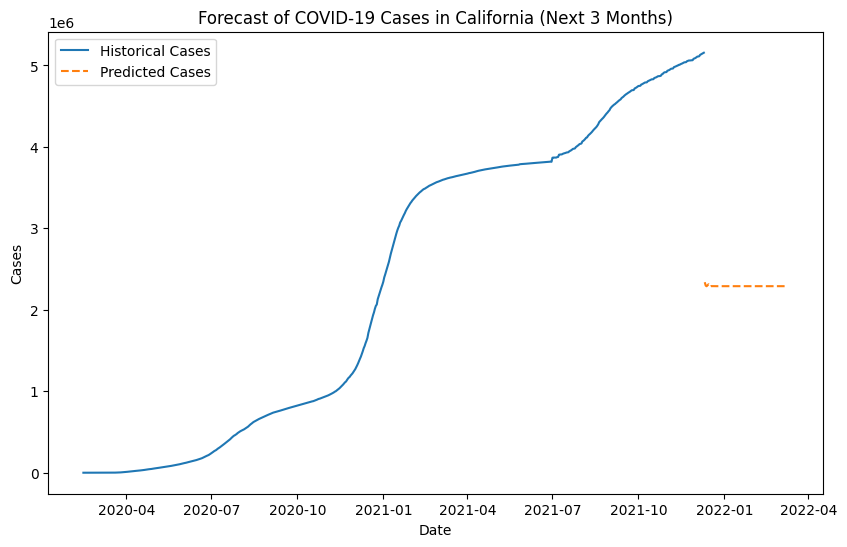

         date       cases
0  2021-12-11  2338514.75
1  2021-12-12  2296149.25
2  2021-12-13  2288974.25
3  2021-12-14  2300859.75
4  2021-12-15  2313145.75
..        ...         ...
85 2022-03-06  2289783.25
86 2022-03-07  2289783.25
87 2022-03-08  2289783.25
88 2022-03-09  2289783.25
89 2022-03-10  2289783.25

[90 rows x 2 columns]


In [71]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler

# Assuming you have already defined CA_df DataFrame with filtered data
# Sample CA_df DataFrame (replace with your actual CA_df)
'''
CA_df = pd.DataFrame({
    'date': ['2024-01-01', '2024-01-02', '2024-01-03', '2024-01-04', '2024-01-05'],
    'state': ['CA', 'CA', 'CA', 'CA', 'CA'],
    'cases': [100, 120, 150, 180, 200]
})
'''

sample_size = 1000
CA_df1 = CA_df.sample(n=sample_size, random_state=42)
# Convert 'date' column to datetime format
CA_df1['date'] = pd.to_datetime(CA_df1['date'])

# Extract 'cases' values as a numpy array
cases_data = CA_df1['cases'].values.reshape(-1, 1)

# Normalize the data using MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_cases = scaler.fit_transform(cases_data)

# Prepare data for LSTM model
def create_dataset(data, look_back=1):
    X, y = [], []
    for i in range(len(data) - look_back):
        X.append(data[i:(i + look_back), 0])
        y.append(data[i + look_back, 0])
    return np.array(X), np.array(y)

# Set the look-back period (number of previous time steps to use as input features)
look_back = 7  # Adjust this value based on your data characteristics

# Create the LSTM dataset
X, y = create_dataset(scaled_cases, look_back)

# Reshape input data to be 3-dimensional [samples, time steps, features]
X = np.reshape(X, (X.shape[0], X.shape[1], 1))

# Build the LSTM model
model = Sequential()
model.add(LSTM(64, input_shape=(look_back, 1)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

# Fit the LSTM model to the data
model.fit(X, y, epochs=10, batch_size=1, verbose=2)

# Predict future COVID-19 cases for the next 3 months (90 days)
future_dates = pd.date_range(start=CA_df['date'].max() + pd.Timedelta(days=1), periods=90)
future_cases = []

# Use the LSTM model to predict future cases
for i in range(90):
    input_data = scaled_cases[-look_back:].reshape(1, look_back, 1)
    predicted_case = model.predict(input_data)[0, 0]
    future_cases.append(predicted_case)
    scaled_cases = np.append(scaled_cases, predicted_case).reshape(-1, 1)

# Inverse transform to get actual predicted values
predicted_cases = scaler.inverse_transform(np.array(future_cases).reshape(-1, 1))

# Create a DataFrame for the predicted dates and cases
predicted_df = pd.DataFrame({'date': future_dates, 'cases': predicted_cases.flatten()})

# Plot the predicted cases
plt.figure(figsize=(10, 6))
plt.plot(CA_df['date'], CA_df['cases'], label='Historical Cases')
plt.plot(predicted_df['date'], predicted_df['cases'], label='Predicted Cases', linestyle='--')
plt.title('Forecast of COVID-19 Cases in California (Next 3 Months)')
plt.xlabel('Date')
plt.ylabel('Cases')
plt.legend()
plt.show()

# Display the predicted DataFrame for the next 3 months
print(predicted_df)
